### website to collect financial data
###  dataset @ https://finance.yahoo.com/quote/MSFT/history/

O download pode ser aplicado abaixo:

https://www.marketwatch.com/investing/stock/msft/download-data

marketwatch Microsoft Corporation Common Stock (MSFT) Historical Quotes

https://www.nasdaq.com/market-activity/stocks/msft/historical

# Vamos coletar todos os dados históricos, no máximo => max


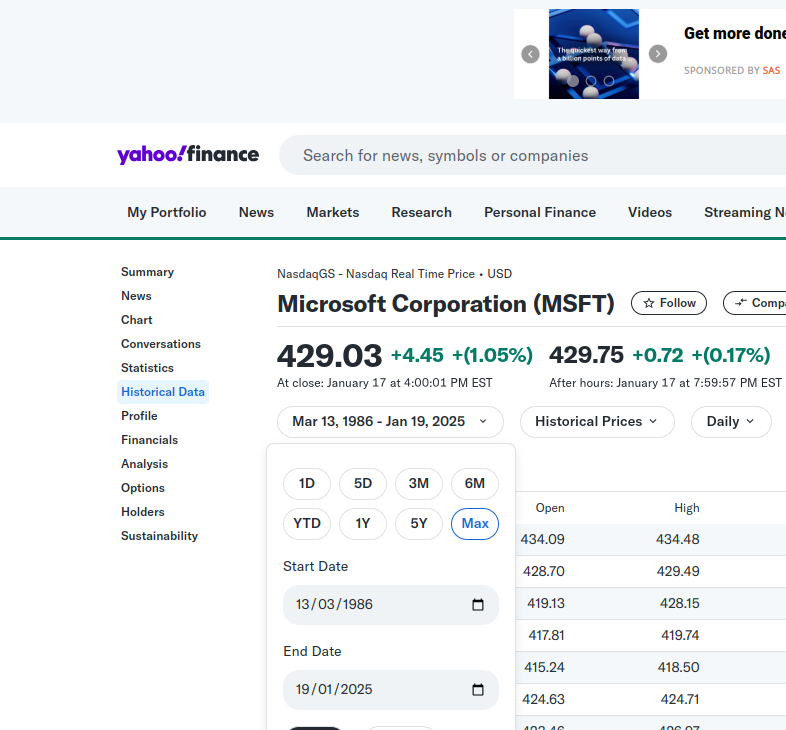

# 1) download base inicial 

https://www.kaggle.com/datasets/varpit94/microsoft-stock-data?resource=download

In [1]:
import pandas as pd

df_MSFT_antigo = pd.read_csv('base_dados/MSFT_oficial.csv')

df_MSFT_antigo


,Date,Open,High,Low,Close,Adj Close,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061434,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063628,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.064725,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063079,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.061982,47894400
...,...,...,...,...,...,...,...
9078,2022-03-18,295.369995,301.000000,292.730011,300.429993,300.429993,43317000
9079,2022-03-21,298.890015,300.140015,294.899994,299.160004,299.160004,28351200
9080,2022-03-22,299.799988,305.000000,298.769989,304.059998,304.059998,27599700
9081,2022-03-23,300.510010,303.230011,297.720001,299.489990,299.489990,25715400


In [2]:
df_MSFT_antigo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9083 entries, 0 to 9082
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       9083 non-null   object 
 1   Open       9083 non-null   float64
 2   High       9083 non-null   float64
 3   Low        9083 non-null   float64
 4   Close      9083 non-null   float64
 5   Adj Close  9083 non-null   float64
 6   Volume     9083 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 496.9+ KB


In [3]:

df_MSFT_novo = pd.read_csv('base_dados/HistoricalData_1737247283050.csv') # valido

df_MSFT_novo

,Date,Close/Last,Volume,Open,High,Low
0,01/17/2025,$429.03,26197510,$434.085,$434.48,$428.17
1,01/16/2025,$424.58,15300020,$428.695,$429.49,$424.39
2,01/15/2025,$426.31,19637840,$419.13,$428.15,$418.265
3,01/14/2025,$415.67,16935860,$417.81,$419.74,$410.72
4,01/13/2025,$417.19,17604780,$415.235,$418.50,$412.29
...,...,...,...,...,...,...
2511,01/26/2015,$47.01,40995700,$47.00,$47.1339,$46.2399
2512,01/23/2015,$47.18,26136690,$47.36,$47.39,$46.80
2513,01/22/2015,$47.13,35842790,$46.38,$47.135,$46.08
2514,01/21/2015,$45.92,37113740,$45.94,$46.14,$45.48


In [4]:
df_MSFT_antigo.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

# 2) Tratamento dos dados 

In [5]:
# Remover o símbolo "$" e converter para float
columns_to_convert = ["Close/Last", "Open", "High", "Low"]
for column in columns_to_convert:
    df_MSFT_novo[column] = df_MSFT_novo[column].replace({"\$": ""}, regex=True).astype(float)

# Converter a coluna "Date" para o tipo datetime
df_MSFT_novo["Date"] = pd.to_datetime(df_MSFT_novo["Date"], format="%m/%d/%Y")

df_MSFT_novo= df_MSFT_novo[['Date', 'Open', 'High', 'Low', 'Close/Last', 'Volume']] # não tem 'Adj Close',, adaptar depois
df_MSFT_novo = df_MSFT_novo.rename(columns={"Close/Last": "Close"})
df_MSFT_novo = df_MSFT_novo.sort_values(by='Date', ascending=True).reset_index(drop=True)


<>:4: SyntaxWarning: invalid escape sequence '\$'
<>:4: SyntaxWarning: invalid escape sequence '\$'
/tmp/ipykernel_85298/1436705504.py:4: SyntaxWarning: invalid escape sequence '\$'
  df_MSFT_novo[column] = df_MSFT_novo[column].replace({"\$": ""}, regex=True).astype(float)


In [6]:
df_MSFT_novo.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume'], dtype='object')

In [7]:
df_MSFT_novo

,Date,Open,High,Low,Close,Volume
0,2015-01-20,46.300,46.6500,45.5700,46.39,36121800
1,2015-01-21,45.940,46.1400,45.4800,45.92,37113740
2,2015-01-22,46.380,47.1350,46.0800,47.13,35842790
3,2015-01-23,47.360,47.3900,46.8000,47.18,26136690
4,2015-01-26,47.000,47.1339,46.2399,47.01,40995700
...,...,...,...,...,...,...
2511,2025-01-13,415.235,418.5000,412.2900,417.19,17604780
2512,2025-01-14,417.810,419.7400,410.7200,415.67,16935860
2513,2025-01-15,419.130,428.1500,418.2650,426.31,19637840
2514,2025-01-16,428.695,429.4900,424.3900,424.58,15300020


In [8]:
# Converter a coluna "Date" para o tipo datetime
df_MSFT_antigo["Date"] = pd.to_datetime(df_MSFT_antigo["Date"], format="%Y-%m-%d")
df_MSFT_antigo

,Date,Open,High,Low,Close,Adj Close,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061434,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063628,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.064725,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063079,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.061982,47894400
...,...,...,...,...,...,...,...
9078,2022-03-18,295.369995,301.000000,292.730011,300.429993,300.429993,43317000
9079,2022-03-21,298.890015,300.140015,294.899994,299.160004,299.160004,28351200
9080,2022-03-22,299.799988,305.000000,298.769989,304.059998,304.059998,27599700
9081,2022-03-23,300.510010,303.230011,297.720001,299.489990,299.489990,25715400


In [9]:
# Concatenar os DataFrames
df_concat_MSFT = pd.concat([df_MSFT_antigo, df_MSFT_novo], ignore_index=True)
df_concat_MSFT

,Date,Open,High,Low,Close,Adj Close,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061434,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063628,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.064725,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063079,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.061982,47894400
...,...,...,...,...,...,...,...
11594,2025-01-13,415.235000,418.500000,412.290000,417.190000,NaN,17604780
11595,2025-01-14,417.810000,419.740000,410.720000,415.670000,NaN,16935860
11596,2025-01-15,419.130000,428.150000,418.265000,426.310000,NaN,19637840
11597,2025-01-16,428.695000,429.490000,424.390000,424.580000,NaN,15300020


In [10]:

# Adicionar uma coluna com os anos
df_concat_MSFT["datinha"] = df_concat_MSFT["Date"].dt.date
df_concat_MSFT

,Date,Open,High,Low,Close,Adj Close,Volume,datinha
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061434,1031788800,1986-03-13
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063628,308160000,1986-03-14
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.064725,133171200,1986-03-17
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063079,67766400,1986-03-18
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.061982,47894400,1986-03-19
...,...,...,...,...,...,...,...,...
11594,2025-01-13,415.235000,418.500000,412.290000,417.190000,NaN,17604780,2025-01-13
11595,2025-01-14,417.810000,419.740000,410.720000,415.670000,NaN,16935860,2025-01-14
11596,2025-01-15,419.130000,428.150000,418.265000,426.310000,NaN,19637840,2025-01-15
11597,2025-01-16,428.695000,429.490000,424.390000,424.580000,NaN,15300020,2025-01-16


In [11]:
# Remover linhas com anos repetidos, mantendo apenas o primeiro
df_unique_days = df_concat_MSFT.drop_duplicates(subset=["datinha"], keep="first").drop(columns=["datinha"])

# Exibir o resultado
display(df_unique_days)

,Date,Open,High,Low,Close,Adj Close,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061434,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063628,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.064725,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063079,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.061982,47894400
...,...,...,...,...,...,...,...
11594,2025-01-13,415.235000,418.500000,412.290000,417.190000,NaN,17604780
11595,2025-01-14,417.810000,419.740000,410.720000,415.670000,NaN,16935860
11596,2025-01-15,419.130000,428.150000,418.265000,426.310000,NaN,19637840
11597,2025-01-16,428.695000,429.490000,424.390000,424.580000,NaN,15300020


In [12]:
df_unique_days.loc[df_unique_days['Date'] =='2015-01-21']

,Date,Open,High,Low,Close,Adj Close,Volume
7275,2015-01-21,45.939999,46.139999,45.48,45.919998,40.370354,39081100


In [13]:
df_concat_MSFT.loc[df_concat_MSFT['Date'] =='2015-01-21']

,Date,Open,High,Low,Close,Adj Close,Volume,datinha
7275,2015-01-21,45.939999,46.139999,45.48,45.919998,40.370354,39081100,2015-01-21
9084,2015-01-21,45.940000,46.140000,45.48,45.920000,NaN,37113740,2015-01-21


# 3) Pré processamento dos dados

In [14]:
df_study = df_unique_days[['Date', 'Close']]

df_study = df_study.reset_index(drop=True) # ajustar o index valores
df_study

,Date,Close
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9785,2025-01-13,417.190000
9786,2025-01-14,415.670000
9787,2025-01-15,426.310000
9788,2025-01-16,424.580000


In [15]:
df_study.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9790 entries, 0 to 9789
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    9790 non-null   datetime64[ns]
 1   Close   9790 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 153.1 KB


In [16]:
# base do estudo https://www.youtube.com/watch?v=CbTU92pbDKw&t=1020s

# transformar a coluna Date para index

In [17]:
df_study.index = df_study.pop('Date')
df_study

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090
...,...
2025-01-13,417.190000
2025-01-14,415.670000
2025-01-15,426.310000


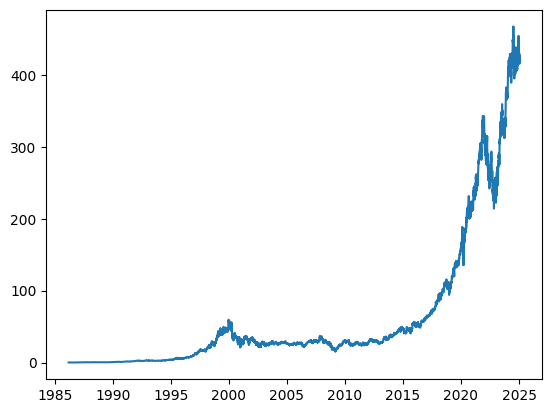

In [18]:
import matplotlib.pyplot as plt

plt.plot(df_study.index, df_study['Close'])

In [19]:
#!pip install plotly

In [20]:
import plotly.graph_objects as go

# Criar o gráfico com Plotly
fig = go.Figure()

# Adicionar a linha do preço de fechamento
fig.add_trace(go.Scatter(
    x=df_study.index,
    y=df_study['Close'],
    mode='lines+markers',  # Linhas e marcadores
    name='Preço de Fechamento',
    line=dict(color='blue', width=2),
    marker=dict(size=6)
))

# Ajustar título e rótulos
fig.update_layout(
    title="Evolução do Preço de Fechamento",
    title_font=dict(size=20, family='Arial', color='White'),
    xaxis=dict(
        title='Data',
        title_font=dict(size=14),
        tickangle=45,
        showgrid=True,
        gridcolor='lightgray',
        type='date',
    ),
    yaxis=dict(
        title='Preço de Fechamento ($)',
        title_font=dict(size=14),
        showgrid=True,
        gridcolor='lightgray',
    ),
    #template='plotly_white', # deixar o undo mais claro 
    template='plotly_dark',

    legend=dict(
        title="Legenda",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified"  # Informações ao passar o cursor
)

# Mostrar o gráfico
fig.show()

In [21]:
import plotly.graph_objects as go

# Criar o gráfico com Plotly
fig = go.Figure()

# Adicionar a linha do preço de fechamento
fig.add_trace(go.Scatter(
    x=df_study.index,
    y=df_study['Close'],
    mode='lines+markers',  # Linhas e marcadores
    name='Preço de Fechamento',
    line=dict(color='cyan', width=2),
    marker=dict(size=6, color='white', line=dict(color='cyan', width=1))
))

# Ajustar título e rótulos
fig.update_layout(
    title="Evolução do Preço de Fechamento",
    title_font=dict(size=20, family='Arial', color='white'),
    xaxis=dict(
        title='Data',
        title_font=dict(size=14, color='white'),
        tickangle=45,
        showgrid=True,
        gridcolor='gray',
        type='date',
        tickfont=dict(color='white')
    ),
    yaxis=dict(
        title='Preço de Fechamento ($)',
        title_font=dict(size=14, color='white'),
        showgrid=True,
        gridcolor='gray',
        tickfont=dict(color='white')
    ),
    template='plotly_dark',
    legend=dict(
        title="Legenda",
        font=dict(size=12, color='white'),
        x=0.01,
        y=1.05,
        orientation="h",
        bordercolor="gray",
        borderwidth=1
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified",  # Informações ao passar o cursor
)

# Mostrar o gráfico
fig.show()

In [22]:
import datetime

def str_to_datetime(s):
  split = s.split('-')
  year, month, day = int(split[0]), int(split[1]), int(split[2])
  return datetime.datetime(year=year, month=month, day=day)

In [23]:

datetime_object = str_to_datetime('1986-03-19')
datetime_object

datetime.datetime(1986, 3, 19, 0, 0)

In [24]:
df_study_teste = df_study.reset_index()
df_study_teste.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9790 entries, 0 to 9789
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    9790 non-null   datetime64[ns]
 1   Close   9790 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 153.1 KB


In [25]:
import numpy as np

def df_to_windowed_df(dataframe, first_date_str, last_date_str, n=3):
  #  Converte strings de data first_date_str e last_date_str em objetos datetime.
  # no exemplo não precisava pois a formatação já está valendo
  first_date = str_to_datetime(first_date_str)
  last_date  = str_to_datetime(last_date_str)

  target_date = first_date  # '2021-01-17',a data inicial de iteração (target_date).
  
  dates = []   # dates: As datas-alvo para cada linha do resultado.
  X, Y = [], []
  #X: As janelas de valores anteriores.
  # Y: O valor-alvo correspondente.
    
  last_time = False # uma flag (last_time) para determinar quando parar.
  while True:
    df_subset = dataframe.loc[:target_date].tail(n+1)
    # Extrai uma janela de n+1 valores até a data-alvo (target_date). # '2021-01-17',
    #display(df_subset)
    #print(n)
    if len(df_subset) != n+1:
      print(f'Error: Window of size {n} is too large for date {target_date}')
      return
    #Verifica se há valores suficientes para construir a janela. Caso contrário, emite um erro e interrompe.


    values = df_subset['Close'].to_numpy()
    x, y = values[:-1], values[-1]

    #Converte os valores de fechamento (Close) da janela em um array NumPy.
    #x: Valores de entrada (n anteriores).
    #y: Valor-alvo (último da janela).
          
    dates.append(target_date)
    X.append(x)
    Y.append(y)
    #Armazena a data-alvo, os valores de entrada e o valor-alvo.
      

    next_week = dataframe.loc[target_date:target_date+datetime.timedelta(days=7)]
    next_datetime_str = str(next_week.head(2).tail(1).index.values[0])
    next_date_str = next_datetime_str.split('T')[0]
    year_month_day = next_date_str.split('-')
    year, month, day = year_month_day
    next_date = datetime.datetime(day=int(day), month=int(month), year=int(year))
    # Seleciona a semana seguinte a partir da data-alvo.
    # Extrai a próxima data no índice e converte para o formato datetime.
    
    if last_time:
      break
    
    target_date = next_date

    if target_date == last_date:
      last_time = True
    #Atualiza a data-alvo para a próxima data.
    #Encerra o loop se a última data for alcançada.
                               
  ret_df = pd.DataFrame({})
  ret_df['Target Date'] = dates
  # Cria um DataFrame para armazenar as datas-alvo e os valores calculados.

  X = np.array(X)
  for i in range(0, n):
    X[:, i]
    ret_df[f'Target-{n-i}'] = X[:, i]
  #Converte X para um array NumPy e adiciona cada coluna das janelas ao DataFrame.
  #Target-{n-i}: Representa os valores anteriores, do mais distante ao mais próximo.

  ret_df['Target'] = Y
  #Adiciona o valor-alvo correspondente (Y) ao DataFrame.

  return ret_df



In [26]:
# Start day second time around: '2021-01-17'
windowed_df = df_to_windowed_df(df_study, 
                                '2021-03-18', 
                                '2025-01-17', 
                                n=3)
windowed_df

,Target Date,Target-3,Target-2,Target-1,Target
0,2021-03-18,234.809998,237.710007,237.039993,230.720001
1,2021-03-19,237.710007,237.039993,230.720001,230.350006
2,2021-03-22,237.039993,230.720001,230.350006,235.990005
3,2021-03-23,230.720001,230.350006,235.990005,237.580002
4,2021-03-24,230.350006,235.990005,237.580002,235.460007
...,...,...,...,...,...
960,2025-01-13,422.370000,424.560000,418.950000,417.190000
961,2025-01-14,424.560000,418.950000,417.190000,415.670000
962,2025-01-15,418.950000,417.190000,415.670000,426.310000
963,2025-01-16,417.190000,415.670000,426.310000,424.580000


In [27]:
# coleta os 3 dados closes dos 3 últimos dias, e o terget é o close da data atual do index

In [28]:
df_study.loc['2021-01-15':].head(15)

,Close
Date,
2021-01-15,212.649994
2021-01-19,216.440002
2021-01-20,224.339996
2021-01-21,224.970001
2021-01-22,225.949997
2021-01-25,229.529999
2021-01-26,232.330002
2021-01-27,232.899994
2021-01-28,238.929993


In [29]:
df_study.loc[:'2025-01-17'].tail()

,Close
Date,
2025-01-13,417.19
2025-01-14,415.67
2025-01-15,426.31
2025-01-16,424.58
2025-01-17,429.03


It is corresponding output it's just like a regression problem or any other supervised learning problem. 

input:  'Target-3', 'Target-2', 'Target-1',

output: 'Target'

## colocar em uma matrix de 3 dimensões. 

In [30]:
def windowed_df_to_date_X_y(windowed_dataframe):
  df_as_np = windowed_dataframe.to_numpy()
  #Converte o DataFrame para um array NumPy para manipulação direta dos valores.
  display(df_as_np)
  dates = df_as_np[:, 0]
  #Seleciona a primeira coluna do array, que contém as datas.
    
  middle_matrix = df_as_np[:, 1:-1]
  #Seleciona todas as colunas entre a segunda (índice 1) e a penúltima (exclui a última), que formam as variáveis independentes.
  #  colunas:Target-3, Target-2,	Target-1	
  display(middle_matrix)
    
  X = middle_matrix.reshape((len(dates), middle_matrix.shape[1], 1))
  #Redimensiona as features em um formato tridimensional (número de exemplos, número de features, 1 canal), 
  #exigido por alguns modelos, como redes neurais convolucionais.
  # colamos 1 no terceiro valor no parenteses, pois queremos prever 1 variável. 

  Y = df_as_np[:, -1]
  #Seleciona a última coluna do array como os valores-alvo.

    
  return dates, X.astype(np.float32), Y.astype(np.float32)
  #dates: As datas correspondentes às entradas.
  #X: Features em formato tridimensional, convertidas para float32. 
  #Y: Valores-alvo, convertidos para float32.

In [31]:

dates, X, y = windowed_df_to_date_X_y(windowed_df)

dates.shape, X.shape, y.shape

array([[Timestamp('2021-03-18 00:00:00'), 234.809998, 237.710007,
        237.039993, 230.720001],
       [Timestamp('2021-03-19 00:00:00'), 237.710007, 237.039993,
        230.720001, 230.350006],
       [Timestamp('2021-03-22 00:00:00'), 237.039993, 230.720001,
        230.350006, 235.990005],
       ...,
       [Timestamp('2025-01-15 00:00:00'), 418.95, 417.19, 415.67, 426.31],
       [Timestamp('2025-01-16 00:00:00'), 417.19, 415.67, 426.31, 424.58],
       [Timestamp('2025-01-17 00:00:00'), 415.67, 426.31, 424.58, 429.03]],
      dtype=object)

array([[234.809998, 237.710007, 237.039993],
       [237.710007, 237.039993, 230.720001],
       [237.039993, 230.720001, 230.350006],
       ...,
       [418.95, 417.19, 415.67],
       [417.19, 415.67, 426.31],
       [415.67, 426.31, 424.58]], dtype=object)

((965,), (965, 3, 1), (965,))

In [32]:
#  (1006, 3, 1),, 3 passos no passado para chegar ao valor real.

In [33]:
X

array([[[234.81],
        [237.71],
        [237.04]],

       [[237.71],
        [237.04],
        [230.72]],

       [[237.04],
        [230.72],
        [230.35]],

       ...,

       [[418.95],
        [417.19],
        [415.67]],

       [[417.19],
        [415.67],
        [426.31]],

       [[415.67],
        [426.31],
        [424.58]]], dtype=float32)

In [34]:
y

array([230.72 , 230.35 , 235.99 , 237.58 , 235.46 , 232.34 , 236.48 ,
       235.24 , 231.85 , 235.77 , 242.35 , 249.07 , 247.86 , 249.9  ,
       253.25 , 255.85 , 255.91 , 258.49 , 255.59 , 259.5  , 260.74 ,
       258.74 , 258.26 , 260.58 , 257.17 , 261.15 , 261.55 , 261.97 ,
       254.56 , 252.51 , 252.18 , 251.86 , 247.79 , 246.47 , 249.73 ,
       252.46 , 247.18 , 246.23 , 239.   , 243.03 , 248.15 , 245.18 ,
       243.08 , 243.12 , 246.48 , 245.17 , 250.78 , 251.72 , 251.49 ,
       249.31 , 249.68 , 247.4  , 247.3  , 245.71 , 250.79 , 253.81 ,
       252.57 , 253.59 , 257.24 , 257.89 , 259.89 , 258.36 , 257.38 ,
       260.9  , 259.43 , 262.63 , 265.51 , 265.27 , 266.69 , 265.02 ,
       268.72 , 271.4  , 270.9  , 271.6  , 277.65 , 277.66 , 279.93 ,
       277.42 , 277.94 , 277.32 , 280.98 , 282.51 , 281.03 , 280.75 ,
       277.01 , 279.32 , 281.4  , 286.14 , 289.67 , 289.05 , 286.54 ,
       286.22 , 286.5  , 284.91 , 284.82 , 287.12 , 286.51 , 289.52 ,
       289.46 , 288.

In [35]:
dates

array([Timestamp('2021-03-18 00:00:00'), Timestamp('2021-03-19 00:00:00'),
       Timestamp('2021-03-22 00:00:00'), Timestamp('2021-03-23 00:00:00'),
       Timestamp('2021-03-24 00:00:00'), Timestamp('2021-03-25 00:00:00'),
       Timestamp('2021-03-26 00:00:00'), Timestamp('2021-03-29 00:00:00'),
       Timestamp('2021-03-30 00:00:00'), Timestamp('2021-03-31 00:00:00'),
       Timestamp('2021-04-01 00:00:00'), Timestamp('2021-04-05 00:00:00'),
       Timestamp('2021-04-06 00:00:00'), Timestamp('2021-04-07 00:00:00'),
       Timestamp('2021-04-08 00:00:00'), Timestamp('2021-04-09 00:00:00'),
       Timestamp('2021-04-12 00:00:00'), Timestamp('2021-04-13 00:00:00'),
       Timestamp('2021-04-14 00:00:00'), Timestamp('2021-04-15 00:00:00'),
       Timestamp('2021-04-16 00:00:00'), Timestamp('2021-04-19 00:00:00'),
       Timestamp('2021-04-20 00:00:00'), Timestamp('2021-04-21 00:00:00'),
       Timestamp('2021-04-22 00:00:00'), Timestamp('2021-04-23 00:00:00'),
       Timestamp('2021-04

Treinamos  validamos os dados 

In [36]:
q_80 = int(len(dates) * .8)
q_90 = int(len(dates) * .9)

print(q_80, 'q_80')
print(q_90, 'q_90')


772 q_80
868 q_90


In [37]:
# treinaremos 80% dos dados
print('treinaremos 80% dos dados')
dates_train, X_train, y_train = dates[:q_80], X[:q_80], y[:q_80]
print(dates_train, X_train, y_train)

treinaremos 80% dos dados
[Timestamp('2021-03-18 00:00:00') Timestamp('2021-03-19 00:00:00')
 Timestamp('2021-03-22 00:00:00') Timestamp('2021-03-23 00:00:00')
 Timestamp('2021-03-24 00:00:00') Timestamp('2021-03-25 00:00:00')
 Timestamp('2021-03-26 00:00:00') Timestamp('2021-03-29 00:00:00')
 Timestamp('2021-03-30 00:00:00') Timestamp('2021-03-31 00:00:00')
 Timestamp('2021-04-01 00:00:00') Timestamp('2021-04-05 00:00:00')
 Timestamp('2021-04-06 00:00:00') Timestamp('2021-04-07 00:00:00')
 Timestamp('2021-04-08 00:00:00') Timestamp('2021-04-09 00:00:00')
 Timestamp('2021-04-12 00:00:00') Timestamp('2021-04-13 00:00:00')
 Timestamp('2021-04-14 00:00:00') Timestamp('2021-04-15 00:00:00')
 Timestamp('2021-04-16 00:00:00') Timestamp('2021-04-19 00:00:00')
 Timestamp('2021-04-20 00:00:00') Timestamp('2021-04-21 00:00:00')
 Timestamp('2021-04-22 00:00:00') Timestamp('2021-04-23 00:00:00')
 Timestamp('2021-04-26 00:00:00') Timestamp('2021-04-27 00:00:00')
 Timestamp('2021-04-28 00:00:00') Ti

In [38]:
print('vamos validar 10% dos nossos dados')
dates_val, X_val, y_val = dates[q_80:q_90], X[q_80:q_90], y[q_80:q_90]
print(dates_val, X_val, y_val)


vamos validar 10% dos nossos dados
[Timestamp('2024-04-12 00:00:00') Timestamp('2024-04-15 00:00:00')
 Timestamp('2024-04-16 00:00:00') Timestamp('2024-04-17 00:00:00')
 Timestamp('2024-04-18 00:00:00') Timestamp('2024-04-19 00:00:00')
 Timestamp('2024-04-22 00:00:00') Timestamp('2024-04-23 00:00:00')
 Timestamp('2024-04-24 00:00:00') Timestamp('2024-04-25 00:00:00')
 Timestamp('2024-04-26 00:00:00') Timestamp('2024-04-29 00:00:00')
 Timestamp('2024-04-30 00:00:00') Timestamp('2024-05-01 00:00:00')
 Timestamp('2024-05-02 00:00:00') Timestamp('2024-05-03 00:00:00')
 Timestamp('2024-05-06 00:00:00') Timestamp('2024-05-07 00:00:00')
 Timestamp('2024-05-08 00:00:00') Timestamp('2024-05-09 00:00:00')
 Timestamp('2024-05-10 00:00:00') Timestamp('2024-05-13 00:00:00')
 Timestamp('2024-05-14 00:00:00') Timestamp('2024-05-15 00:00:00')
 Timestamp('2024-05-16 00:00:00') Timestamp('2024-05-17 00:00:00')
 Timestamp('2024-05-20 00:00:00') Timestamp('2024-05-21 00:00:00')
 Timestamp('2024-05-22 00:0

In [39]:
print('testaremos os 10% finais dos dados')
dates_test, X_test, y_test = dates[q_90:], X[q_90:], y[q_90:]
print(dates_test, X_test, y_test)

testaremos os 10% finais dos dados
[Timestamp('2024-08-29 00:00:00') Timestamp('2024-08-30 00:00:00')
 Timestamp('2024-09-03 00:00:00') Timestamp('2024-09-04 00:00:00')
 Timestamp('2024-09-05 00:00:00') Timestamp('2024-09-06 00:00:00')
 Timestamp('2024-09-09 00:00:00') Timestamp('2024-09-10 00:00:00')
 Timestamp('2024-09-11 00:00:00') Timestamp('2024-09-12 00:00:00')
 Timestamp('2024-09-13 00:00:00') Timestamp('2024-09-16 00:00:00')
 Timestamp('2024-09-17 00:00:00') Timestamp('2024-09-18 00:00:00')
 Timestamp('2024-09-19 00:00:00') Timestamp('2024-09-20 00:00:00')
 Timestamp('2024-09-23 00:00:00') Timestamp('2024-09-24 00:00:00')
 Timestamp('2024-09-25 00:00:00') Timestamp('2024-09-26 00:00:00')
 Timestamp('2024-09-27 00:00:00') Timestamp('2024-09-30 00:00:00')
 Timestamp('2024-10-01 00:00:00') Timestamp('2024-10-02 00:00:00')
 Timestamp('2024-10-03 00:00:00') Timestamp('2024-10-04 00:00:00')
 Timestamp('2024-10-07 00:00:00') Timestamp('2024-10-08 00:00:00')
 Timestamp('2024-10-09 00:0

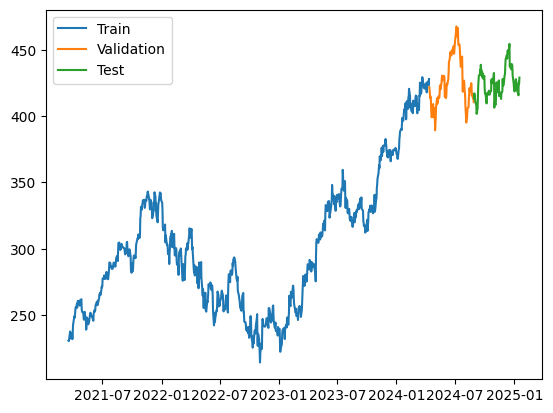

In [40]:

plt.plot(dates_train, y_train)
plt.plot(dates_val, y_val)
plt.plot(dates_test, y_test)

plt.legend(['Train', 'Validation', 'Test'])

In [41]:
import plotly.graph_objects as go

# Criar o gráfico
fig = go.Figure()

# Adicionar as linhas para cada conjunto de dados
fig.add_trace(go.Scatter(
    x=dates_train,
    y=y_train,
    mode='lines',
    name='Train',
    line=dict(color='green', width=2),
))

fig.add_trace(go.Scatter(
    x=dates_val,
    y=y_val,
    mode='lines',
    name='Validation',
    line=dict(color='orange', width=2, dash='dash'),
))

fig.add_trace(go.Scatter(
    x=dates_test,
    y=y_test,
    mode='lines',
    name='Test',
    line=dict(color='red', width=2, dash='dot'),
))

# Configurar o layout
fig.update_layout(
    title="Evolução dos Conjuntos de Dados de Preço de Fechamento -da Microsoft Corporation (MSFT)",
    xaxis_title="Datas",
    yaxis_title="Valores",
    template="plotly_dark",  # Fundo escuro
    legend=dict(
        title="Conjuntos",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified",  # Informações ao passar o cursor
)

# Exibir o gráfico
fig.show()

In [42]:
#!pip install -U kaleido

In [43]:
# Salvar o gráfico como PNG
fig.write_image("grafico_evolucao_preco_MSFT.png")

In [44]:
import plotly.graph_objects as go

# Criar o gráfico
fig = go.Figure()

# Adicionar as linhas para cada conjunto de dados
fig.add_trace(go.Scatter(
    x=dates_train,
    y=y_train,
    mode='lines',
    name='Train',
    line=dict(color='green', width=2),
))

fig.add_trace(go.Scatter(
    x=dates_val,
    y=y_val,
    mode='lines',
    name='Validation',
    line=dict(color='orange', width=2, dash='dash'),
))

fig.add_trace(go.Scatter(
    x=dates_test,
    y=y_test,
    mode='lines',
    name='Test',
    line=dict(color='red', width=2, dash='dot'),
))

# Configurar o layout
fig.update_layout(
    title="Evolução dos Conjuntos de Dados de Preço de Fechamento -da Microsoft Corporation (MSFT)",
    xaxis_title="Datas",
    yaxis_title="Valores",
    template="plotly_dark",  # Fundo escuro
    legend=dict(
        title="Conjuntos",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=100, b=50),  # Margens ajustadas
    width=1000,  # Largura da figura em png
    height=600,  # Altura da figura em png
    hovermode="x unified",  # Informações ao passar o cursor
)

# Exibir o gráfico
fig.show()

# Salvar o gráfico como PNG
fig.write_image("grafico_evolucao_dados2.png")

In [45]:
from tensorflow.keras.models import Sequential
#Importa Sequential para criar um modelo empilhado de camadas.
from tensorflow.keras.optimizers import Adam
#Importa o otimizador Adam para ajustar os pesos durante o treinamento.
from tensorflow.keras import layers
#Importa o módulo layers para adicionar diferentes tipos de camadas ao modelo.

model2 = Sequential([layers.Input((3, 1)),  #1)                   
                    layers.LSTM(64),  #2)
                    layers.Dense(32, activation='relu'), #3) 
                    layers.Dense(32, activation='relu'),
                    layers.Dense(1)]) 

#model.compile(loss='mape', 
#              optimizer=Adam(learning_rate=0.001),
#              metrics=['mean_absolute_error']) #4) 

model2.compile(
    loss='mape',  # Usando MAPE como função de perda
    optimizer=Adam(learning_rate=0.001),
    metrics=['mean_absolute_percentage_error']  # Mantém MAPE como métrica
)

#1) #Inicia um modelo sequencial em que as camadas são empilhadas uma após a outra.
    #Define a camada de entrada com forma (3, 1), que representa sequências de 3 etapas com 1 recurso por etapa.
    # 3 base de dados anteriores, 3 dados de 3 dias anteriores e 1 a previsão que desejamos.  
#2) #Adiciona uma camada LSTM (Long Short-Term Memory) com 64 unidades,
                    # usada para aprender padrões em dados sequenciais.
#3) 
#Camada 1: Uma camada totalmente conectada com 32 neurônios e a função de ativação ReLU.
#Camada 2: Outra camada densa semelhante à primeira.
#Camada de saída: Uma camada densa com 1 neurônio, usada para prever um único valor.

#4) alterei para o mape
#Define a função de perda como MSE (erro médio quadrático), usada para medir o erro na previsão.
#Define o otimizador como Adam com uma taxa de aprendizado de 0.001, que ajusta os pesos do modelo.
#Adiciona a métrica MAE (erro absoluto médio) para avaliar o desempenho durante o treinamento e validação.
model2.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)

2025-01-19 18:46:23.667120: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-19 18:46:23.667724: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-19 18:46:23.670008: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-01-19 18:46:23.676094: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1737323183.686473   85298 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1737323183.68

Epoch 1/100


2025-01-19 18:46:24.812985: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 99.6990 - mean_absolute_percentage_error: 99.6990 - val_loss: 99.2252 - val_mean_absolute_percentage_error: 99.2252
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 98.4366 - mean_absolute_percentage_error: 98.4366 - val_loss: 97.8030 - val_mean_absolute_percentage_error: 97.8030
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 95.9820 - mean_absolute_percentage_error: 95.9820 - val_loss: 94.9939 - val_mean_absolute_percentage_error: 94.9939
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 90.8810 - mean_absolute_percentage_error: 90.8810 - val_loss: 88.1631 - val_mean_absolute_percentage_error: 88.1631
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 78.8418 - mean_absolute_percentage_error: 78.8418 - val_loss: 75.5925 - val_mean_absolute_percentage_error: 75.5925
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 58.6124 - mean_absolute_percentage_error: 58.6124 - val_loss: 56.4055 - val_me

In [46]:

#O otimizador Adam (Adaptive Moment Estimation) é um algoritmo usado para ajustar os pesos de um modelo de aprendizado de máquina
#durante o processo de treinamento. Ele ajuda o modelo a encontrar os melhores pesos para minimizar a função de perda.

#Por que usar Adam?
#É um otimizador eficiente e amplamente utilizado porque combina as vantagens de outros algoritmos de otimização:
#Momentum: Considera a velocidade e direção passada para ajustar os pesos de forma mais estável.
#RMSProp: Ajusta a taxa de aprendizado para cada peso de acordo com a frequência com que ele é atualizado.

In [47]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers

model = Sequential([layers.Input((3, 1)),
                    layers.LSTM(64),
                    layers.Dense(32, activation='relu'),
                    layers.Dense(32, activation='relu'),
                    layers.Dense(1)])

model.compile(loss='mse', 
              optimizer=Adam(learning_rate=0.001),
              metrics=['mean_absolute_error'])

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100) # epochs rodaremos 100 etapas do dataset

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 92513.3281 - mean_absolute_error: 299.8173 - val_loss: 181049.8281 - val_mean_absolute_error: 425.0781
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 91205.7812 - mean_absolute_error: 297.9078 - val_loss: 180246.3281 - val_mean_absolute_error: 424.1319
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 93259.3438 - mean_absolute_error: 301.1649 - val_loss: 178296.0781 - val_mean_absolute_error: 421.8267
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 89911.5703 - mean_absolute_error: 295.6878 - val_loss: 174189.0312 - val_mean_absolute_error: 416.9300
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 85141.7656 - mean_absolute_error: 287.5310 - val_loss: 165177.7812 - val_mean_absolute_error: 405.9792
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 78759.9219 - mean_absolute_error: 276.1432 - val_loss: 148098.3594 - val_mean_absolute_error: 384.3688
Epoch 7/100
25/25 ━━━━━━━━━━

model = usa mse e o model2 usa o mape para a validação

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


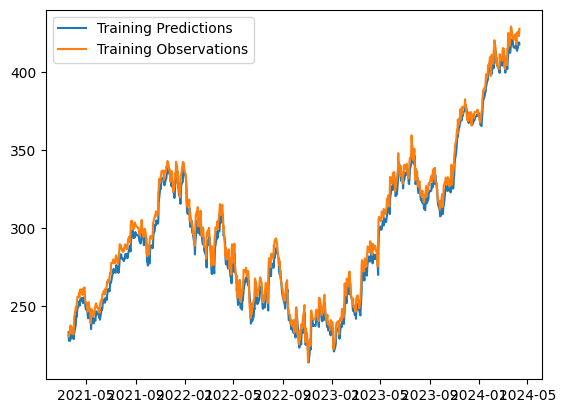

In [48]:
train_predictions = model2.predict(X_train).flatten()

plt.plot(dates_train, train_predictions)
plt.plot(dates_train, y_train)
plt.legend(['Training Predictions', 'Training Observations'])

In [49]:

# Criar o gráfico
fig = go.Figure()

# Adicionar as previsões de treinamento
fig.add_trace(go.Scatter(
    x=dates_train, 
    y=train_predictions, 
    mode='lines',
    name='Training Predictions',
    line=dict(color='blue', width=2)
))

# Adicionar as observações de treinamento
fig.add_trace(go.Scatter(
    x=dates_train, 
    y=y_train, 
    mode='lines',
    name='Training Observations',
    line=dict(color='orange', width=2, dash='dot')
))

# Ajustar o layout do gráfico
fig.update_layout(
    title="Training Predictions vs Observations",
    title_font=dict(size=20, family='Arial', color='white'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=14),
        tickangle=45,
        showgrid=True,
        gridcolor='gray',
    ),
    yaxis=dict(
        title='Values',
        title_font=dict(size=14),
        showgrid=True,
        gridcolor='gray',
    ),
    template='plotly_dark',  # Fundo escuro
    legend=dict(
        title="Legend",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified"
)

# Exibir o gráfico
fig.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


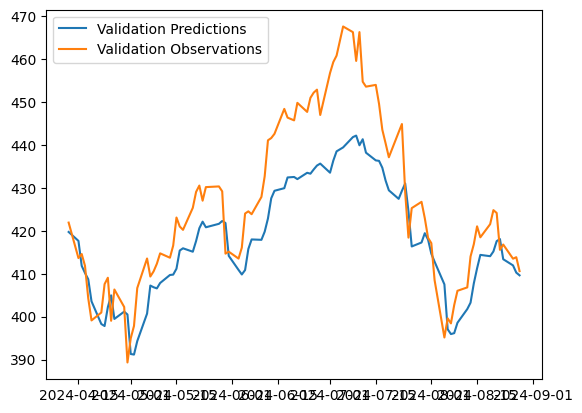

In [50]:
val_predictions = model2.predict(X_val).flatten()

plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.legend(['Validation Predictions', 'Validation Observations'])

In [51]:
fig = go.Figure()

# Adicionar as previsões de treinamento
fig.add_trace(go.Scatter(
    x=dates_val, 
    y=val_predictions, 
    mode='lines',
    name='Validation Predictions',
    line=dict(color='blue', width=2)
))

# Adicionar as observações de treinamento
fig.add_trace(go.Scatter(
    x=dates_val, 
    y=y_val, 
    mode='lines',
    name='Validation Observations',
    line=dict(color='orange', width=2, dash='dot')
))

# Ajustar o layout do gráfico
fig.update_layout(
    title="Validation Predictions vs Observations",
    title_font=dict(size=20, family='Arial', color='white'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=14),
        tickangle=45,
        showgrid=True,
        gridcolor='gray',
    ),
    yaxis=dict(
        title='Values',
        title_font=dict(size=14),
        showgrid=True,
        gridcolor='gray',
    ),
    template='plotly_dark',  # Fundo escuro
    legend=dict(
        title="Legend",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified"
)

# Exibir o gráfico
fig.show()

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


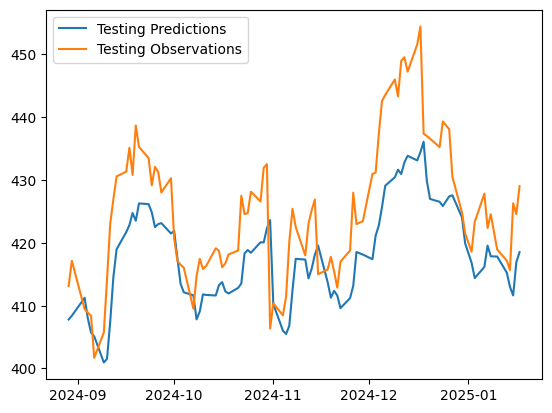

In [52]:
test_predictions = model2.predict(X_test).flatten()

plt.plot(dates_test, test_predictions)
plt.plot(dates_test, y_test)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [53]:
fig = go.Figure()

# Adicionar as previsões de treinamento
fig.add_trace(go.Scatter(
    x=dates_test, 
    y=test_predictions, 
    mode='lines',
    name='Test Predictions',
    line=dict(color='blue', width=2)
))

# Adicionar as observações de treinamento
fig.add_trace(go.Scatter(
    x=dates_test, 
    y=y_test, 
    mode='lines',
    name='Test Observations',
    line=dict(color='orange', width=2, dash='dot')
))

# Ajustar o layout do gráfico
fig.update_layout(
    title="Test Predictions vs Observations",
    title_font=dict(size=20, family='Arial', color='white'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=14),
        tickangle=45,
        showgrid=True,
        gridcolor='gray',
    ),
    yaxis=dict(
        title='Values',
        title_font=dict(size=14),
        showgrid=True,
        gridcolor='gray',
    ),
    template='plotly_dark',  # Fundo escuro
    legend=dict(
        title="Legend",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified"
)

# Exibir o gráfico
fig.show()

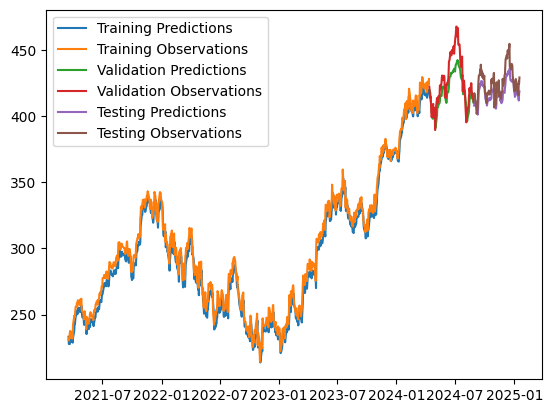

In [54]:
plt.plot(dates_train, train_predictions)
plt.plot(dates_train, y_train)
plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.plot(dates_test, test_predictions)
plt.plot(dates_test, y_test)
plt.legend(['Training Predictions', 
            'Training Observations',
            'Validation Predictions', 
            'Validation Observations',
            'Testing Predictions', 
            'Testing Observations'])

In [55]:
import plotly.graph_objects as go

# Criar o gráfico
fig = go.Figure()

# Adicionar as linhas para previsões e observações de treino
fig.add_trace(go.Scatter(
    x=dates_train, 
    y=train_predictions, 
    mode='lines', 
    name='Training Predictions',
    line=dict(color='blue', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_train, 
    y=y_train, 
    mode='lines', 
    name='Training Observations',
    line=dict(color='blue', width=2, dash='dot')
))

# Adicionar as linhas para previsões e observações de validação
fig.add_trace(go.Scatter(
    x=dates_val, 
    y=val_predictions, 
    mode='lines', 
    name='Validation Predictions',
    line=dict(color='green', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_val, 
    y=y_val, 
    mode='lines', 
    name='Validation Observations',
    line=dict(color='green', width=2, dash='dot')
))

# Adicionar as linhas para previsões e observações de teste
fig.add_trace(go.Scatter(
    x=dates_test, 
    y=test_predictions, 
    mode='lines', 
    name='Testing Predictions',
    line=dict(color='red', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_test, 
    y=y_test, 
    mode='lines', 
    name='Testing Observations',
    line=dict(color='red', width=2, dash='dot')
))

# Ajustar o layout do gráfico
fig.update_layout(
    title="Predictions vs Observations Across Training, Validation, and Testing Sets",
    title_font=dict(size=20, family='Arial', color='white'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=14),
        tickangle=45,
        showgrid=True,
        gridcolor='gray',
    ),
    yaxis=dict(
        title='Values',
        title_font=dict(size=14),
        showgrid=True,
        gridcolor='gray',
    ),
    template='plotly_dark',  # Fundo escuro
    legend=dict(
        title="Legend",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified"  # Informações exibidas ao passar o cursor
)

# Exibir o gráfico
fig.show()

In [56]:
# devemos terinar com os dados mais elevados, teremos que reduzir os valores menores

In [57]:
from copy import deepcopy

recursive_predictions = []
recursive_dates = np.concatenate([dates_val, dates_test])
display(recursive_dates)

array([Timestamp('2024-04-12 00:00:00'), Timestamp('2024-04-15 00:00:00'),
       Timestamp('2024-04-16 00:00:00'), Timestamp('2024-04-17 00:00:00'),
       Timestamp('2024-04-18 00:00:00'), Timestamp('2024-04-19 00:00:00'),
       Timestamp('2024-04-22 00:00:00'), Timestamp('2024-04-23 00:00:00'),
       Timestamp('2024-04-24 00:00:00'), Timestamp('2024-04-25 00:00:00'),
       Timestamp('2024-04-26 00:00:00'), Timestamp('2024-04-29 00:00:00'),
       Timestamp('2024-04-30 00:00:00'), Timestamp('2024-05-01 00:00:00'),
       Timestamp('2024-05-02 00:00:00'), Timestamp('2024-05-03 00:00:00'),
       Timestamp('2024-05-06 00:00:00'), Timestamp('2024-05-07 00:00:00'),
       Timestamp('2024-05-08 00:00:00'), Timestamp('2024-05-09 00:00:00'),
       Timestamp('2024-05-10 00:00:00'), Timestamp('2024-05-13 00:00:00'),
       Timestamp('2024-05-14 00:00:00'), Timestamp('2024-05-15 00:00:00'),
       Timestamp('2024-05-16 00:00:00'), Timestamp('2024-05-17 00:00:00'),
       Timestamp('2024-05

In [58]:

for target_date in recursive_dates:
  last_window = deepcopy(X_train[-1])
  next_prediction = model2.predict(np.array([last_window])).flatten()
  #display(next_prediction)
  recursive_predictions.append(next_prediction)
  last_window[-1] = next_prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

In [59]:
recursive_dates

array([Timestamp('2024-04-12 00:00:00'), Timestamp('2024-04-15 00:00:00'),
       Timestamp('2024-04-16 00:00:00'), Timestamp('2024-04-17 00:00:00'),
       Timestamp('2024-04-18 00:00:00'), Timestamp('2024-04-19 00:00:00'),
       Timestamp('2024-04-22 00:00:00'), Timestamp('2024-04-23 00:00:00'),
       Timestamp('2024-04-24 00:00:00'), Timestamp('2024-04-25 00:00:00'),
       Timestamp('2024-04-26 00:00:00'), Timestamp('2024-04-29 00:00:00'),
       Timestamp('2024-04-30 00:00:00'), Timestamp('2024-05-01 00:00:00'),
       Timestamp('2024-05-02 00:00:00'), Timestamp('2024-05-03 00:00:00'),
       Timestamp('2024-05-06 00:00:00'), Timestamp('2024-05-07 00:00:00'),
       Timestamp('2024-05-08 00:00:00'), Timestamp('2024-05-09 00:00:00'),
       Timestamp('2024-05-10 00:00:00'), Timestamp('2024-05-13 00:00:00'),
       Timestamp('2024-05-14 00:00:00'), Timestamp('2024-05-15 00:00:00'),
       Timestamp('2024-05-16 00:00:00'), Timestamp('2024-05-17 00:00:00'),
       Timestamp('2024-05

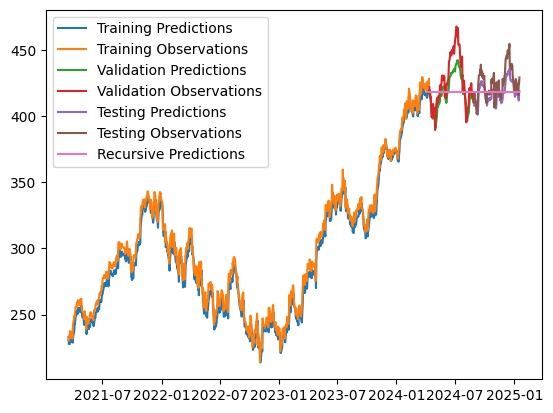

In [60]:
plt.plot(dates_train, train_predictions)
plt.plot(dates_train, y_train)
plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.plot(dates_test, test_predictions)
plt.plot(dates_test, y_test)
plt.plot(recursive_dates, recursive_predictions)
plt.legend(['Training Predictions', 
            'Training Observations',
            'Validation Predictions', 
            'Validation Observations',
            'Testing Predictions', 
            'Testing Observations',
            'Recursive Predictions'])

In [61]:
recursive_predictions

[array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=float32),
 array([417.99493], dtype=fl

In [62]:
train_predictions

array([233.19955, 227.75201, 227.667  , 232.42133, 233.54689, 231.84889,
       229.24208, 232.98529, 231.52536, 228.76625, 232.36136, 237.94945,
       243.96132, 242.88031, 245.11456, 248.06458, 250.44069, 250.5668 ,
       253.07733, 250.31927, 254.14645, 255.05269, 253.34363, 253.00328,
       255.08295, 251.83655, 255.72833, 255.83804, 256.40247, 249.54948,
       247.85794, 247.29156, 246.91501, 243.18155, 242.10362, 244.956  ,
       247.27628, 242.49364, 241.9342 , 235.19577, 239.08469, 243.24113,
       240.50623, 238.9532 , 238.93832, 241.90092, 240.56581, 245.91835,
       246.49178, 246.51088, 244.56169, 244.96748, 242.76764, 242.7776 ,
       241.22633, 245.94174, 248.4451 , 247.43439, 248.55542, 251.84268,
       252.37497, 254.38298, 252.938  , 252.15929, 255.38947, 253.88275,
       257.0595 , 259.60367, 259.46848, 260.93036, 259.3362 , 262.88882,
       265.26892, 264.94128, 265.7208 , 271.37686, 271.40576, 273.80865,
       271.46915, 272.03607, 271.34833, 274.80646, 

In [63]:
import plotly.graph_objects as go

# Criar o gráfico
fig = go.Figure()

# Adicionar as linhas para previsões e observações de treino
fig.add_trace(go.Scatter(
    x=dates_train, 
    y=train_predictions, 
    mode='lines', 
    name='Training Predictions',
    line=dict(color='blue', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_train, 
    y=y_train, 
    mode='lines', 
    name='Training Observations',
    line=dict(color='blue', width=2, dash='dot')
))

# Adicionar as linhas para previsões e observações de validação
fig.add_trace(go.Scatter(
    x=dates_val, 
    y=val_predictions, 
    mode='lines', 
    name='Validation Predictions',
    line=dict(color='green', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_val, 
    y=y_val, 
    mode='lines', 
    name='Validation Observations',
    line=dict(color='green', width=2, dash='dot')
))

# Adicionar as linhas para previsões e observações de teste
fig.add_trace(go.Scatter(
    x=dates_test, 
    y=test_predictions, 
    mode='lines', 
    name='Testing Predictions',
    line=dict(color='red', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_test, 
    y=y_test, 
    mode='lines', 
    name='Testing Observations',
    line=dict(color='red', width=2, dash='dot')
))


fig.add_trace(go.Scatter(
    x=recursive_dates, 
    y=recursive_predictions, 
    mode='lines', 
    name='Recursive date',
    line=dict(color='purple', width=2,)
))

# Ajustar o layout do gráfico
fig.update_layout(
    title="Predictions vs Observations Across Training, Validation, and Testing Sets",
    title_font=dict(size=20, family='Arial', color='white'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=14),
        tickangle=45,
        showgrid=True,
        gridcolor='gray',
    ),
    yaxis=dict(
        title='Values',
        title_font=dict(size=14),
        showgrid=True,
        gridcolor='gray',
    ),
    template='plotly_dark',  # Fundo escuro
    legend=dict(
        title="Legend",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified"  # Informações exibidas ao passar o cursor
)

# Exibir o gráfico
fig.show()

# gráfico correto 

In [64]:
# Extraia os valores de cada array em recursive_predictions
recursive_predictions_flat = [item[0] for item in recursive_predictions]
recursive_predictions_flat

[np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.99493),
 np.float32(417.

In [65]:
import plotly.graph_objects as go

# Criar o gráfico
fig = go.Figure()

# Adicionar as linhas para previsões e observações de treino
fig.add_trace(go.Scatter(
    x=dates_train, 
    y=train_predictions, 
    mode='lines', 
    name='Training Predictions',
    line=dict(color='blue', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_train, 
    y=y_train, 
    mode='lines', 
    name='Training Observations',
    line=dict(color='blue', width=2, dash='dot')
))

# Adicionar as linhas para previsões e observações de validação
fig.add_trace(go.Scatter(
    x=dates_val, 
    y=val_predictions, 
    mode='lines', 
    name='Validation Predictions',
    line=dict(color='green', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_val, 
    y=y_val, 
    mode='lines', 
    name='Validation Observations',
    line=dict(color='green', width=2, dash='dot')
))

# Adicionar as linhas para previsões e observações de teste
fig.add_trace(go.Scatter(
    x=dates_test, 
    y=test_predictions, 
    mode='lines', 
    name='Testing Predictions',
    line=dict(color='red', width=2)
))

fig.add_trace(go.Scatter(
    x=dates_test, 
    y=y_test, 
    mode='lines', 
    name='Testing Observations',
    line=dict(color='red', width=2, dash='dot')
))

# Adicionar as linhas para previsões recursivas
fig.add_trace(go.Scatter(
    x=recursive_dates, 
    y=recursive_predictions_flat, 
    mode='lines', 
    name='Recursive Predictions',
    line=dict(color='purple', width=2, dash='dash')
))

# Ajustar o layout do gráfico
fig.update_layout(
    title="Predictions vs Observations Across Training, Validation, Testing, and Recursive Sets",
    title_font=dict(size=20, family='Arial', color='white'),
    xaxis=dict(
        title='Date',
        title_font=dict(size=14),
        tickangle=45,
        showgrid=True,
        gridcolor='gray',
    ),
    yaxis=dict(
        title='Values',
        title_font=dict(size=14),
        showgrid=True,
        gridcolor='gray',
    ),
    template='plotly_dark',  # Fundo escuro
    legend=dict(
        title="Legend",
        font=dict(size=12),
        x=0.01,
        y=1.05,
        orientation="h"
    ),
    margin=dict(l=50, r=50, t=80, b=50),
    hovermode="x unified"  # Informações exibidas ao passar o cursor
)

# Exibir o gráfico
fig.show()

# 4)  previsão com todos os dados 

In [66]:
dates # dados completos


array([Timestamp('2021-03-18 00:00:00'), Timestamp('2021-03-19 00:00:00'),
       Timestamp('2021-03-22 00:00:00'), Timestamp('2021-03-23 00:00:00'),
       Timestamp('2021-03-24 00:00:00'), Timestamp('2021-03-25 00:00:00'),
       Timestamp('2021-03-26 00:00:00'), Timestamp('2021-03-29 00:00:00'),
       Timestamp('2021-03-30 00:00:00'), Timestamp('2021-03-31 00:00:00'),
       Timestamp('2021-04-01 00:00:00'), Timestamp('2021-04-05 00:00:00'),
       Timestamp('2021-04-06 00:00:00'), Timestamp('2021-04-07 00:00:00'),
       Timestamp('2021-04-08 00:00:00'), Timestamp('2021-04-09 00:00:00'),
       Timestamp('2021-04-12 00:00:00'), Timestamp('2021-04-13 00:00:00'),
       Timestamp('2021-04-14 00:00:00'), Timestamp('2021-04-15 00:00:00'),
       Timestamp('2021-04-16 00:00:00'), Timestamp('2021-04-19 00:00:00'),
       Timestamp('2021-04-20 00:00:00'), Timestamp('2021-04-21 00:00:00'),
       Timestamp('2021-04-22 00:00:00'), Timestamp('2021-04-23 00:00:00'),
       Timestamp('2021-04

Passos para Previsão de 365 dias:

Treinamento do modelo: O modelo já está treinado com os dados históricos. O próximo passo é utilizar o modelo treinado para gerar previsões para os próximos 365 dias.

Previsão Recursiva para 365 dias: Assim como foi feito anteriormente para o próximo ano, precisaremos usar a última janela de dados (baseada em X_test) para fazer previsões, e para cada previsão gerada, usamos a previsão como entrada para gerar a próxima.

Armazenamento das Previsões e Datas: Armazenaremos as previsões e as datas correspondentes.

# Passo 1: Previsão Recursiva para 365 Dias


In [67]:
import datetime
import numpy as np

# Obter a última data
last_date = dates[-1]
print(f"Última data no conjunto de dados: {last_date}")

Última data no conjunto de dados: 2025-01-17 00:00:00


In [68]:

# Inicializar as variáveis para armazenar as previsões e as datas
predictions = []
future_dates = []

# Começar com a última janela de dados (última entrada de X_test)
current_input = X_test[-1]  # Usando os últimos dados de X_test como ponto de partida
current_input

array([[415.67],
       [426.31],
       [424.58]], dtype=float32)

In [69]:

# Prever para os próximos 365 dias
for i in range(365):  # Previsões para os próximos 365 dias
    # Fazer a previsão do próximo valor
    next_prediction = model2.predict(current_input.reshape(1, 3, 1))  # Redimensionar para as entradas do modelo
    predictions.append(next_prediction.flatten()[0])  # Adicionar a previsão

    # Gerar a próxima data (incrementando 1 dia)
    next_date = last_date + datetime.timedelta(days=1)
    future_dates.append(next_date)

    # Atualizar a entrada para o próximo valor
    current_input = np.roll(current_input, shift=-1)  # Desloca as entradas
    current_input[-1] = next_prediction  # Substitui a última entrada pela previsão gerada

    # Atualizar a última data
    last_date = next_date

# Exibir as previsões para os próximos 365 dias
print(f"Previsões para os próximos 365 dias: {predictions}")
print(f"Datas futuras: {future_dates}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

Explicação do código:

Última data: O código começa obtendo a última data disponível em dates, que será usada para gerar as datas futuras.
    
Laço de 365 dias: A previsão é feita de forma recursiva para os próximos 365 dias, com o modelo fazendo previsões e utilizando as previsões anteriores como entradas.

Atualização da entrada: Cada previsão gerada é adicionada à entrada para prever o próximo valor.
    
Armazenamento das previsões: As previsões e as datas correspondentes são armazenadas em predictions e future_dates, respectivamente.

Passo 2: Visualizar as Previsões

Para visualizar as previsões geradas para os próximos 365 dias, podemos usar o seguinte código:




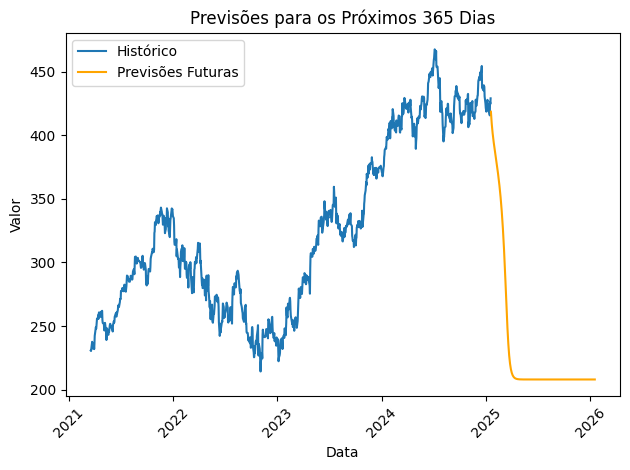

In [70]:
import matplotlib.pyplot as plt

# Plotar os dados históricos e as previsões futuras
plt.plot(dates, y, label="Histórico")  # Dados históricos
plt.plot(future_dates, predictions, label="Previsões Futuras", color='orange')  # Previsões futuras
plt.legend()
plt.title("Previsões para os Próximos 365 Dias")
plt.xlabel("Data")
plt.ylabel("Valor")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 5) Base inicial para a previsão real 

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step


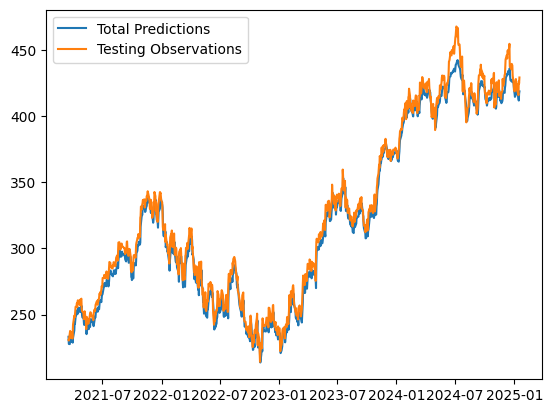

In [71]:
#real 
total_predictions = model2.predict(X).flatten()

plt.plot(dates, total_predictions)
plt.plot(dates, y)
plt.legend(['Total Predictions', 'Testing Observations'])

In [72]:
# Para prever os próximos 30 dias
num_days_to_predict = 30
predictions = []

# Usando a última data e os últimos dados para iniciar a previsão
last_data = X[-1].reshape(1, X.shape[1], 1)

for _ in range(num_days_to_predict):
    pred = model2.predict(last_data)
    predictions.append(pred[0][0])
    
    # Atualizar os dados para o próximo dia
    last_data = np.roll(last_data, shift=-1, axis=1)
    last_data[0, -1, 0] = pred  # Substituir o último valor com a previsão

# Gerar as datas para as previsões
last_date = pd.to_datetime(dates[-1])
forecast_dates = [last_date + pd.Timedelta(days=i) for i in range(1, num_days_to_predict + 1)]

# Agora você tem as previsões e as datas correspondentes para os próximos 30 dias

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

/tmp/ipykernel_85298/2045621775.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [73]:
forecast_dates

[Timestamp('2025-01-18 00:00:00'),
 Timestamp('2025-01-19 00:00:00'),
 Timestamp('2025-01-20 00:00:00'),
 Timestamp('2025-01-21 00:00:00'),
 Timestamp('2025-01-22 00:00:00'),
 Timestamp('2025-01-23 00:00:00'),
 Timestamp('2025-01-24 00:00:00'),
 Timestamp('2025-01-25 00:00:00'),
 Timestamp('2025-01-26 00:00:00'),
 Timestamp('2025-01-27 00:00:00'),
 Timestamp('2025-01-28 00:00:00'),
 Timestamp('2025-01-29 00:00:00'),
 Timestamp('2025-01-30 00:00:00'),
 Timestamp('2025-01-31 00:00:00'),
 Timestamp('2025-02-01 00:00:00'),
 Timestamp('2025-02-02 00:00:00'),
 Timestamp('2025-02-03 00:00:00'),
 Timestamp('2025-02-04 00:00:00'),
 Timestamp('2025-02-05 00:00:00'),
 Timestamp('2025-02-06 00:00:00'),
 Timestamp('2025-02-07 00:00:00'),
 Timestamp('2025-02-08 00:00:00'),
 Timestamp('2025-02-09 00:00:00'),
 Timestamp('2025-02-10 00:00:00'),
 Timestamp('2025-02-11 00:00:00'),
 Timestamp('2025-02-12 00:00:00'),
 Timestamp('2025-02-13 00:00:00'),
 Timestamp('2025-02-14 00:00:00'),
 Timestamp('2025-02-

In [74]:
len(predictions)

30

In [75]:
# Gerar as datas para as previsões
last_date = pd.to_datetime(dates[-1])
forecast_dates = [last_date + pd.Timedelta(days=i) for i in range(1, num_days_to_predict + 1)]
forecast_dates

[Timestamp('2025-01-18 00:00:00'),
 Timestamp('2025-01-19 00:00:00'),
 Timestamp('2025-01-20 00:00:00'),
 Timestamp('2025-01-21 00:00:00'),
 Timestamp('2025-01-22 00:00:00'),
 Timestamp('2025-01-23 00:00:00'),
 Timestamp('2025-01-24 00:00:00'),
 Timestamp('2025-01-25 00:00:00'),
 Timestamp('2025-01-26 00:00:00'),
 Timestamp('2025-01-27 00:00:00'),
 Timestamp('2025-01-28 00:00:00'),
 Timestamp('2025-01-29 00:00:00'),
 Timestamp('2025-01-30 00:00:00'),
 Timestamp('2025-01-31 00:00:00'),
 Timestamp('2025-02-01 00:00:00'),
 Timestamp('2025-02-02 00:00:00'),
 Timestamp('2025-02-03 00:00:00'),
 Timestamp('2025-02-04 00:00:00'),
 Timestamp('2025-02-05 00:00:00'),
 Timestamp('2025-02-06 00:00:00'),
 Timestamp('2025-02-07 00:00:00'),
 Timestamp('2025-02-08 00:00:00'),
 Timestamp('2025-02-09 00:00:00'),
 Timestamp('2025-02-10 00:00:00'),
 Timestamp('2025-02-11 00:00:00'),
 Timestamp('2025-02-12 00:00:00'),
 Timestamp('2025-02-13 00:00:00'),
 Timestamp('2025-02-14 00:00:00'),
 Timestamp('2025-02-

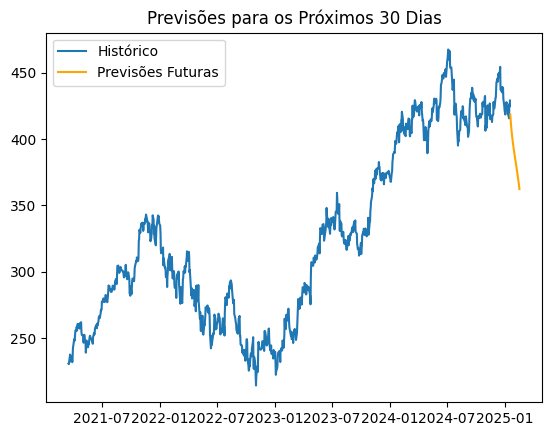

In [76]:

# Agora você tem as previsões e as datas correspondentes para os próximos 30 dias

# Plotar os dados históricos e as previsões futuras
plt.plot(dates, y, label="Histórico")  # Dados históricos
plt.plot(forecast_dates, predictions, label="Previsões Futuras", color='orange')  # Previsões futuras
plt.legend()
plt.title("Previsões para os Próximos 30 Dias")
plt.show()

In [77]:
import plotly.graph_objects as go
import pandas as pd

# Gerar a figura com Plotly
fig = go.Figure()

# Adicionar os dados históricos
fig.add_trace(go.Scatter(
    x=dates, 
    y=y, 
    mode='lines', 
    name='Histórico',
    line=dict(color='blue', width=2)
))

# Adicionar as previsões futuras
fig.add_trace(go.Scatter(
    x=forecast_dates, 
    y=predictions, 
    mode='lines', 
    name='Previsões Futuras',
    line=dict(color='orange', width=2, dash='dash')
))

# Atualizar o layout para incluir título, rótulos, e configurações de eixos
fig.update_layout(
    title="Previsões para os Próximos 30 Dias",
    xaxis_title="Data",
    yaxis_title="Valor",
    title_x=0.5,  # Centralizar o título
    xaxis=dict(tickangle=45),  # Rotacionar as datas no eixo X
    legend=dict(x=0, y=1, traceorder='normal', orientation='h'),
    template="plotly_dark",  # Estilo visual
    width=800,  # Tamanho da figura
    height=500  # Tamanho da figura
)

# Mostrar o gráfico
fig.show()

In [78]:
windowed_df

,Target Date,Target-3,Target-2,Target-1,Target
0,2021-03-18,234.809998,237.710007,237.039993,230.720001
1,2021-03-19,237.710007,237.039993,230.720001,230.350006
2,2021-03-22,237.039993,230.720001,230.350006,235.990005
3,2021-03-23,230.720001,230.350006,235.990005,237.580002
4,2021-03-24,230.350006,235.990005,237.580002,235.460007
...,...,...,...,...,...
960,2025-01-13,422.370000,424.560000,418.950000,417.190000
961,2025-01-14,424.560000,418.950000,417.190000,415.670000
962,2025-01-15,418.950000,417.190000,415.670000,426.310000
963,2025-01-16,417.190000,415.670000,426.310000,424.580000


In [79]:
df_study

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090
...,...
2025-01-13,417.190000
2025-01-14,415.670000
2025-01-15,426.310000


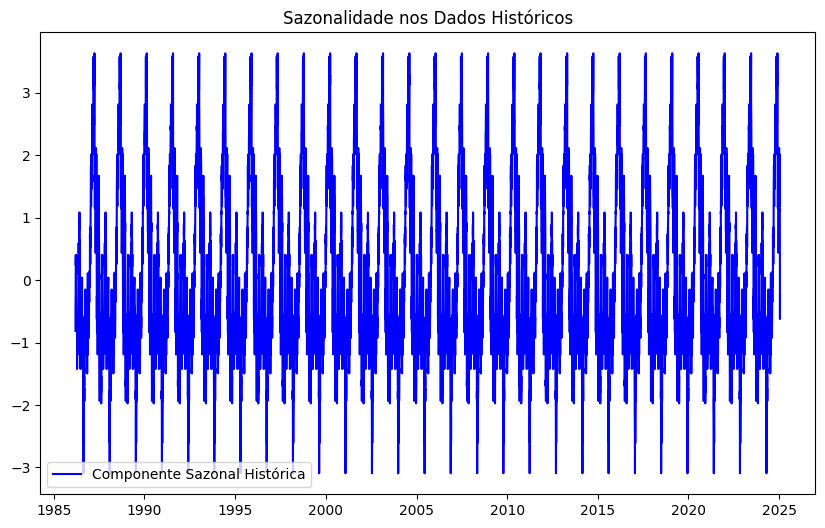

In [80]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompor os dados históricos (com ciclo de 365 dias se aplicável)
result = seasonal_decompose(df_study, period=365, model='additive')
seasonal_component = result.seasonal

# Plotando a sazonalidade histórica
plt.figure(figsize=(10, 6))
plt.plot(seasonal_component, label="Componente Sazonal Histórica", color='blue')
plt.title("Sazonalidade nos Dados Históricos")
plt.legend()
plt.show()

In [81]:
#!pip install statsmodels


# Apenas o cálculo da tendência 

In [82]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import pandas as pd

# Supondo que você tenha um DataFrame com colunas 'date' e 'value'
# Exemplo: df_study = pd.DataFrame({'date': ..., 'value': ...})
df_study_news = pd.DataFrame({'date': dates, 'value close': y})  # Substitua `dates` e `y` pelos seus dados reais
df_study_news

,date,value close
0,2021-03-18,230.720001
1,2021-03-19,230.350006
2,2021-03-22,235.990005
3,2021-03-23,237.580002
4,2021-03-24,235.460007
...,...,...
960,2025-01-13,417.190002
961,2025-01-14,415.670013
962,2025-01-15,426.309998
963,2025-01-16,424.579987


In [83]:
df_study_news['date'] = pd.to_datetime(df_study_news['date'])


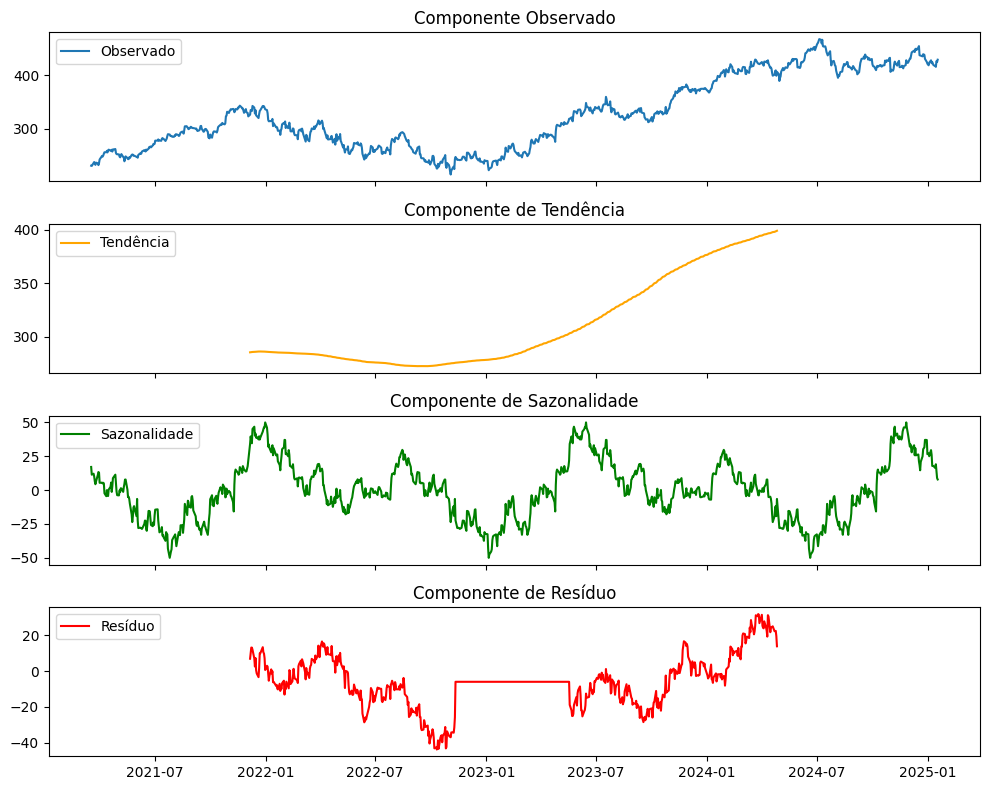

In [84]:

df_study_news.set_index('date', inplace=True)

# Decompor os dados históricos (ajuste o 'period' se necessário, ex.: 7 para dados semanais)
result = seasonal_decompose(df_study_news['value close'], period=365, model='additive')  # ou 'multiplicative'

# Plotar os componentes da decomposição
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

axes[0].plot(result.observed, label='Observado')
axes[0].legend(loc='upper left')
axes[0].set_title("Componente Observado")

axes[1].plot(result.trend, label='Tendência', color='orange')
axes[1].legend(loc='upper left')
axes[1].set_title("Componente de Tendência")

axes[2].plot(result.seasonal, label='Sazonalidade', color='green')
axes[2].legend(loc='upper left')
axes[2].set_title("Componente de Sazonalidade")

axes[3].plot(result.resid, label='Resíduo', color='red')
axes[3].legend(loc='upper left')
axes[3].set_title("Componente de Resíduo")

plt.tight_layout()
plt.show()

# Nova simulação pelo LSTM

In [85]:
X.shape, y.shape, dates.shape

((965, 3, 1), (965,), (965,))

# 2. Definição do Modelo LSTM novamente

In [86]:
input_steps = 3 # 3 dias anteriores
output_steps = 30 # Prevendo os próximos 30 dias

from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
# modelo porjetado para saídas múltiplas
model3 = Sequential([
    layers.Input((input_steps, 1)),  # Sequências de entrada (timesteps, features)
    layers.LSTM(64, return_sequences=False),  # LSTM com 64 unidades
    layers.Dense(32, activation='relu'),      # Camada densa com ativação ReLU
    layers.Dense(output_steps)                # Camada de saída com 30 previsões
])

model3.compile(
    loss='mse',
    optimizer=Adam(learning_rate=0.001),
    metrics=['mae']
)

model3.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 30)             │           990 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,966 (77.99 KB)

 Trainable params: 19,966 (77.99 KB)

 Non-trainable params: 0 (0.00 B)

In [89]:
# teste

numero_antes_simuladodata=3
# Função para prever os próximos 'output_steps' dias com as datas
def predict_next_days_with_dates(model, last_data, output_steps, last_date):
    predictions = []
    forecast_dates = []
    
    # Previsões para os próximos 'output_steps' dias
    for i in range(output_steps):
        # Faz uma previsão para o próximo valor
        next_day_prediction = model.predict(last_data)
        
        # Adiciona a previsão para os próximos dias
        predictions.append(next_day_prediction[0, 0])
        
        # Gera a próxima data
        next_date = last_date + pd.Timedelta(days=1)
        forecast_dates.append(next_date)
        last_date = next_date  # Atualiza a data
        
        # Atualiza 'last_data' com a previsão mais recente
        last_data = np.roll(last_data, shift=-1, axis=1)  # Rola os dados para a esquerda
        last_data[0, -1, 0] = next_day_prediction[0, 0]  # Atualiza com a previsão mais recente
    
    return forecast_dates, predictions

# Previsão para os próximos 30 dias, começando com os últimos dados conhecidos
last_data = X[-1].reshape(1, numero_antes_simuladodata, 1)  # Últimos 'n' dias
last_date = pd.to_datetime(dates[-1])  # Última data no conjunto de dados

forecast_dates, predicted_30_days = predict_next_days_with_dates(model3, last_data, output_steps=30, last_date=last_date)

# Exibir resultados
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Predicted Close': predicted_30_days})
print(forecast_df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

In [90]:
model4 = Sequential([
    layers.Input((X.shape[1], X.shape[2])),
    layers.LSTM(64),
    layers.Dense(1),  # Prevendo um único passo
    layers.Dense(output_steps) # Camada de saída com 30 previsões output_steps = 30 # Prevendo os próximos 30 dias


])

model4.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 30)             │            60 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,021 (66.49 KB)

 Trainable params: 17,021 (66.49 KB)

 Non-trainable params: 0 (0.00 B)

In [91]:
# Previsão para os próximos 30 dias, começando com os últimos dados conhecidos
last_data = X[-1].reshape(1, numero_antes_simuladodata, 1)  # Últimos 'n' dias
last_date = pd.to_datetime(dates[-1])  # Última data no conjunto de dados

forecast_dates, predicted_30_days = predict_next_days_with_dates(model4, last_data, output_steps=30, last_date=last_date)

# Exibir resultados
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Predicted Close': predicted_30_days})
print(forecast_df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━

# previsão para os próximos 30 dias - teste 2 

In [93]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam

# Definindo o modelo
model5 = Sequential([
    layers.Input(shape=(numero_antes_simuladodata, 1)),  # Entrada com 'n' passos de tempo e 1 feature
    layers.LSTM(64, return_sequences=False),  # LSTM com 64 unidades
    layers.Dense(32, activation='relu'),      # Camada densa com ReLU
    layers.Dense(1)                          # Saída com 1 valor
])

model5.compile(
    loss='mse',  # Função de perda de erro quadrático médio
    optimizer=Adam(learning_rate=0.001),  # Otimizador Adam
    metrics=['mae']  # Métrica de erro absoluto médio
)

# Treinando o modelo
model5.fit(X, y, epochs=100, batch_size=32, validation_split=0.2)

# Exibindo o resumo do modelo
model5.summary()

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 91862.6172 - mae: 299.1591 - val_loss: 179218.0469 - val_mae: 423.0587
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 91941.2500 - mae: 299.2086 - val_loss: 177314.0156 - val_mae: 420.8024
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 90459.6797 - mae: 296.6031 - val_loss: 173742.9688 - val_mae: 416.5374
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 87108.0312 - mae: 290.7662 - val_loss: 169658.6562 - val_mae: 411.6057
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 83484.5781 - mae: 284.4423 - val_loss: 164403.2656 - val_mae: 405.1715
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 80766.9531 - mae: 279.5132 - val_loss: 159022.2188 - val_mae: 398.4757
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 77597.6953 - mae: 273.9708 - val_loss: 152804.1094 - val_mae: 390.5953
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 73028.9453 - mae: 265.4465 - va

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                   │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,029 (222.77 KB)

 Trainable params: 19,009 (74.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 38,020 (148.52 KB)

In [94]:
# Fazendo previsões para o próximo valor com os últimos dados
last_data = X[-1].reshape(1, numero_antes_simuladodata, 1)  # Últimos 'n' dias

# Previsão
predictions = model5.predict(last_data)

print("Previsão para o próximo valor:", predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Previsão para o próximo valor: [[405.77975]]


In [95]:
# Previsão para os próximos 30 dias, começando com os últimos dados conhecidos
last_data = X[-1].reshape(1, numero_antes_simuladodata, 1)  # Últimos 'n' dias
last_date = pd.to_datetime(dates[-1])  # Última data no conjunto de dados

forecast_dates, predicted_30_days = predict_next_days_with_dates(model5, last_data, output_steps=30, last_date=last_date)

# Exibir resultados
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Predicted Close': predicted_30_days})
print(forecast_df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

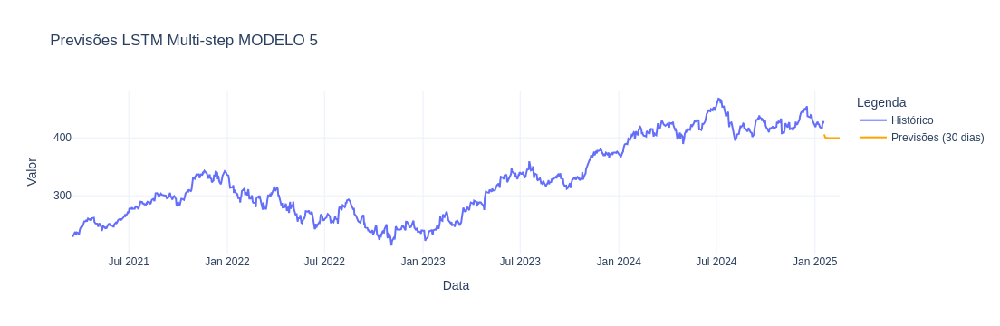

In [96]:
import plotly.graph_objects as go

# Dados históricos
fig = go.Figure()
fig.add_trace(go.Scatter(x=dates, y=y, mode='lines', name='Histórico'))

# Previsões futuras
fig.add_trace(go.Scatter(x=forecast_dates, y=predicted_30_days, mode='lines', name='Previsões (30 dias)', line=dict(color='orange')))

fig.update_layout(
    title="Previsões LSTM Multi-step MODELO 5",
    xaxis_title="Data",
    yaxis_title="Valor",
    legend_title="Legenda",
    template="plotly_white"
)

fig.show()

In [97]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam

# Definindo o modelo para previsão de 30 dias
model6 = Sequential([
    layers.Input(shape=(numero_antes_simuladodata, 1)),  # Entrada com 'n' passos de tempo e 1 feature
    layers.LSTM(64, return_sequences=False),  # LSTM com 64 unidades
    layers.Dense(32, activation='relu'),      # Camada densa com ReLU
    layers.Dense(30)                          # Saída com 30 valores (um para cada um dos próximos 30 dias)
])

model6.compile(
    loss='mse',  # Função de perda de erro quadrático médio
    optimizer=Adam(learning_rate=0.001),  # Otimizador Adam
    metrics=['mae']  # Métrica de erro absoluto médio
)

model6.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_5 (LSTM)                   │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 30)             │           990 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,966 (77.99 KB)

 Trainable params: 19,966 (77.99 KB)

 Non-trainable params: 0 (0.00 B)

In [100]:

# Previsão para os próximos 30 dias, começando com os últimos dados conhecidos
last_data = X[-1].reshape(1, numero_antes_simuladodata, 1)  # Últimos 'n' dias
last_date = pd.to_datetime(dates[-1])  # Última data no conjunto de dados

forecast_dates, predicted_30_days = predict_next_days_with_dates(model, last_data, output_steps=30, last_date=last_date)

# Exibir resultados
forecast_df = pd.DataFrame({'Date': forecast_dates, 'Predicted Close': predicted_30_days})
print(forecast_df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━

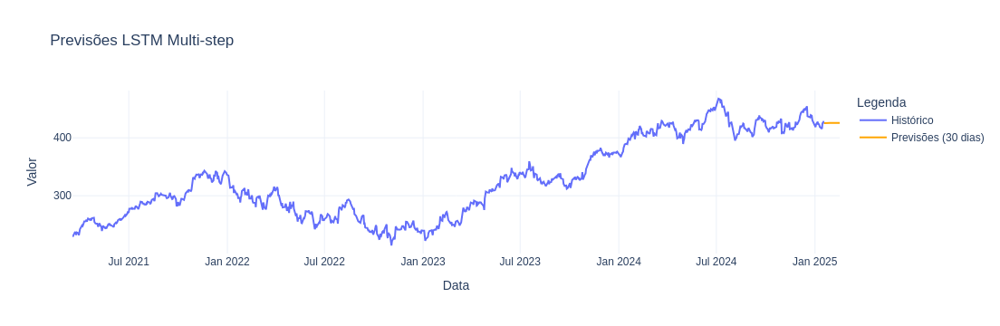

In [101]:
import plotly.graph_objects as go
# previsão de um dia

# Dados históricos
fig = go.Figure()
fig.add_trace(go.Scatter(x=dates, y=y, mode='lines', name='Histórico'))

# Previsões futuras
fig.add_trace(go.Scatter(x=forecast_dates, y=predicted_30_days, mode='lines', name='Previsões (30 dias)', line=dict(color='orange')))

fig.update_layout(
    title="Previsões LSTM Multi-step",
    xaxis_title="Data",
    yaxis_title="Valor",
    legend_title="Legenda",
    template="plotly_white"
)

fig.show()

# treinando os modelos 

# faremos a previsão 

In [104]:
df_study

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090
...,...
2025-01-13,417.190000
2025-01-14,415.670000
2025-01-15,426.310000


In [113]:
df_study_new_0 = df_study.tail(1200)
df_study_new_0

,Close
Date,
2020-04-13,165.509995
2020-04-14,173.699997
2020-04-15,171.880005
2020-04-16,177.039993
2020-04-17,178.600006
...,...
2025-01-13,417.190000
2025-01-14,415.670000
2025-01-15,426.310000


In [108]:
# Prevendo valores de teste
predictions = model6.predict(df_study)
predictions

306/306 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


array([[ 1.3222409e-04, -1.9439289e-03, -7.3408167e-04, ...,
        -3.3067266e-04,  3.6561055e-04,  7.1620656e-04],
       [ 1.3651857e-04, -2.0137215e-03, -7.5992598e-04, ...,
        -3.4197720e-04,  3.7911415e-04,  7.4143457e-04],
       [ 1.3865624e-04, -2.0486475e-03, -7.7284640e-04, ...,
        -3.4761918e-04,  3.8588198e-04,  7.5404660e-04],
       ...,
       [-1.7695308e-01, -3.1753477e-01, -1.4678356e-01, ...,
        -1.0840945e-01,  4.6751618e-01,  6.2039763e-02],
       [-1.7710462e-01, -3.1739733e-01, -1.4676817e-01, ...,
        -1.0833353e-01,  4.6736947e-01,  6.2058188e-02],
       [-1.7671728e-01, -3.1774876e-01, -1.4680789e-01, ...,
        -1.0852632e-01,  4.6774417e-01,  6.2010661e-02]], dtype=float32)

# importar a biblioteca 

In [114]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# preparando o modelo

In [118]:
data = df_study_new_0.copy()

# Usar apenas a coluna 'Close'
close_data = data['Close'].values
close_data = close_data.reshape(-1, 1)

# Normalizar os dados com MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(close_data)

# Dividir os dados em conjunto de treino e teste (80% treino, 20% teste)
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Criar sequências de dados para o LSTM (exemplo de janela de 60 dias)
def create_dataset(data, time_step=60):
    X, y = [], []
    for i in range(time_step, len(data)):
        X.append(data[i-time_step:i, 0])  # Sequência dos últimos 60 dias
        y.append(data[i, 0])  # Valor futuro
    return np.array(X), np.array(y)

# Preparar dados de treino e teste
X_train, y_train = create_dataset(train_data)
X_test, y_test = create_dataset(test_data)

# Redimensionar para o formato [amostras, time_steps, features] para o LSTM
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

In [120]:
from tensorflow.keras.layers import Input

# Criar o modelo LSTM com a camada Input
model7 = Sequential()

# Definir a entrada com a camada Input
model7.add(Input(shape=(X_train.shape[1], 1)))

# Camada LSTM
model7.add(LSTM(units=50, return_sequences=True))
model7.add(LSTM(units=50, return_sequences=False))

# Camada densa de saída
model7.add(Dense(units=1))

# Compilar o modelo
model7.compile(optimizer='adam', loss='mean_squared_error')

In [124]:
model7.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_8 (LSTM)                   │ (None, 60, 50)         │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,651 (119.73 KB)

 Trainable params: 30,651 (119.73 KB)

 Non-trainable params: 0 (0.00 B)

In [125]:
# Treinar o modelo LSTM
model7.fit(X_train, y_train, epochs=10, batch_size=32)

Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0467
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0028
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0012
Epoch 4/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0010
Epoch 5/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0010
Epoch 6/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 9.5978e-04
Epoch 7/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 9.4712e-04
Epoch 8/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 9.3590e-04
Epoch 9/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 9.7563e-04
Epoch 10/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 9.6188e-04


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━

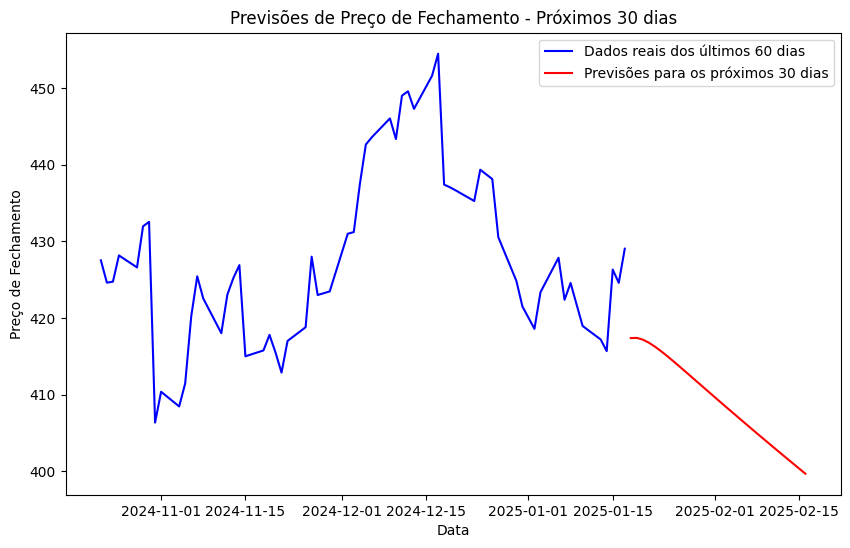

In [126]:
# Prever os próximos 30 dias
last_60_days = scaled_data[-60:]  # Últimos 60 dias de dados
input_data = last_60_days.reshape(1, -1)  # Redimensionar para o formato adequado
input_data = input_data[0]  # Pegar a sequência de 60 dias

# Gerar previsões para os próximos 30 dias
predictions = []
for _ in range(30):
    pred_input = input_data.reshape(1, -1, 1)  # Redimensionar para o formato LSTM
    predicted_value = model7.predict(pred_input)
    predictions.append(predicted_value[0, 0])
    
    # Atualizar a sequência com o valor previsto
    input_data = np.append(input_data, predicted_value)
    input_data = input_data[1:]

# Desnormalizar as previsões
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))

# Plotar os resultados
plt.figure(figsize=(10, 6))
plt.plot(data.index[-60:], close_data[-60:], label='Dados reais dos últimos 60 dias', color='blue')
plt.plot(pd.date_range(data.index[-1], periods=31, freq='D')[1:], predictions, label='Previsões para os próximos 30 dias', color='red')
plt.xlabel('Data')
plt.ylabel('Preço de Fechamento')
plt.title('Previsões de Preço de Fechamento - Próximos 30 dias')
plt.legend()
plt.show()

In [128]:
predictions

array([[417.3745 ],
       [417.39932],
       [417.17075],
       [416.77258],
       [416.2631 ],
       [415.68164],
       [415.0551 ],
       [414.40076],
       [413.7302 ],
       [413.05045],
       [412.3664 ],
       [411.68073],
       [410.9952 ],
       [410.3107 ],
       [409.62817],
       [408.9476 ],
       [408.26944],
       [407.59366],
       [406.92035],
       [406.24957],
       [405.58136],
       [404.91568],
       [404.25262],
       [403.59198],
       [402.93402],
       [402.2786 ],
       [401.6257 ],
       [400.97537],
       [400.32755],
       [399.68225]], dtype=float32)

In [129]:
forecast_dates

[Timestamp('2025-01-18 00:00:00'),
 Timestamp('2025-01-19 00:00:00'),
 Timestamp('2025-01-20 00:00:00'),
 Timestamp('2025-01-21 00:00:00'),
 Timestamp('2025-01-22 00:00:00'),
 Timestamp('2025-01-23 00:00:00'),
 Timestamp('2025-01-24 00:00:00'),
 Timestamp('2025-01-25 00:00:00'),
 Timestamp('2025-01-26 00:00:00'),
 Timestamp('2025-01-27 00:00:00'),
 Timestamp('2025-01-28 00:00:00'),
 Timestamp('2025-01-29 00:00:00'),
 Timestamp('2025-01-30 00:00:00'),
 Timestamp('2025-01-31 00:00:00'),
 Timestamp('2025-02-01 00:00:00'),
 Timestamp('2025-02-02 00:00:00'),
 Timestamp('2025-02-03 00:00:00'),
 Timestamp('2025-02-04 00:00:00'),
 Timestamp('2025-02-05 00:00:00'),
 Timestamp('2025-02-06 00:00:00'),
 Timestamp('2025-02-07 00:00:00'),
 Timestamp('2025-02-08 00:00:00'),
 Timestamp('2025-02-09 00:00:00'),
 Timestamp('2025-02-10 00:00:00'),
 Timestamp('2025-02-11 00:00:00'),
 Timestamp('2025-02-12 00:00:00'),
 Timestamp('2025-02-13 00:00:00'),
 Timestamp('2025-02-14 00:00:00'),
 Timestamp('2025-02-

In [131]:
# Extraia os valores de cada array em recursive_predictions
predictions2 = [item[0] for item in predictions]
predictions2

[np.float32(417.3745),
 np.float32(417.39932),
 np.float32(417.17075),
 np.float32(416.77258),
 np.float32(416.2631),
 np.float32(415.68164),
 np.float32(415.0551),
 np.float32(414.40076),
 np.float32(413.7302),
 np.float32(413.05045),
 np.float32(412.3664),
 np.float32(411.68073),
 np.float32(410.9952),
 np.float32(410.3107),
 np.float32(409.62817),
 np.float32(408.9476),
 np.float32(408.26944),
 np.float32(407.59366),
 np.float32(406.92035),
 np.float32(406.24957),
 np.float32(405.58136),
 np.float32(404.91568),
 np.float32(404.25262),
 np.float32(403.59198),
 np.float32(402.93402),
 np.float32(402.2786),
 np.float32(401.6257),
 np.float32(400.97537),
 np.float32(400.32755),
 np.float32(399.68225)]

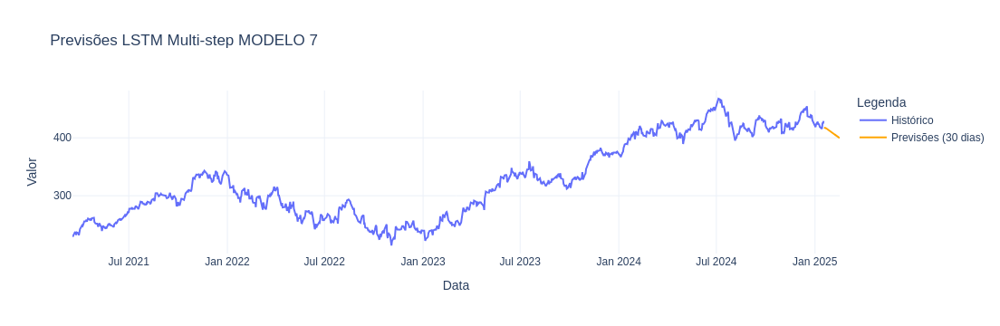

In [133]:
import plotly.graph_objects as go

# Dados históricos
fig = go.Figure()
fig.add_trace(go.Scatter(x=dates, y=y, mode='lines', name='Histórico'))

# Previsões futuras
fig.add_trace(go.Scatter(x=forecast_dates, y=predictions2, mode='lines', name='Previsões (30 dias)', line=dict(color='orange')))

fig.update_layout(
    title="Previsões LSTM Multi-step MODELO 7",
    xaxis_title="Data",
    yaxis_title="Valor",
    legend_title="Legenda",
    template="plotly_white"
)

fig.show()

In [134]:
# Previsão nos dados de teste
test_predictions = model7.predict(X_test)

# Desnormalizar as previsões
test_predictions = scaler.inverse_transform(test_predictions)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calcular o erro quadrático médio (MSE)
mse = mean_squared_error(y_test_original, test_predictions)
print(f'Mean Squared Error: {mse}')

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Mean Squared Error: 120.31085978643917


In [135]:
# Previsão nos dados de teste
test_predictions = model7.predict(X_test)

# Desnormalizar as previsões
test_predictions = scaler.inverse_transform(test_predictions)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))

# Calcular o MAPE
mape = np.mean(np.abs((y_test_original - test_predictions) / y_test_original)) * 100

# Exibir o MAPE
print(f'MAPE: {mape:.2f}%')

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
MAPE: 2.20%
